In [1]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torchinfo import summary


manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)


Random Seed:  999


In [18]:
IMAGE_SIZE=64
TRAIN_DATA_ROOT="afhq/train"
TEST_DATA_ROOT="afhq/val"
BATCH_SIZE=128
NUM_CHANNELS=3
Z=100
NGPU=8
NUM_GEN_FM=64
NUM_DIS_FM=64
MAX_EPOCHS=40
LEARNING_RATE=0.0002
BETA_1=0.5



device = torch.device("cuda:0" if (torch.cuda.is_available() and NGPU > 0) else "cpu")
device

device(type='cuda', index=0)

In [3]:
train_dataset = dset.ImageFolder(root=TRAIN_DATA_ROOT,
                           transform=transforms.Compose([
                               transforms.Resize(IMAGE_SIZE),
                               transforms.CenterCrop(IMAGE_SIZE),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
test_dataset = dset.ImageFolder(root=TEST_DATA_ROOT,
                           transform=transforms.Compose([
                               transforms.Resize(IMAGE_SIZE),
                               transforms.CenterCrop(IMAGE_SIZE),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE,
                                         shuffle=True)

test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE,
                                         shuffle=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([128, 3, 64, 64])


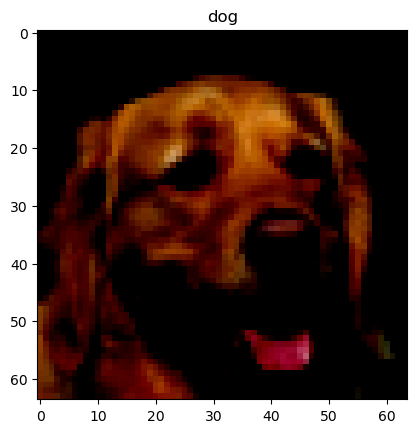

In [4]:
image_batch,label_batch=next(iter(train_dataloader))
print(image_batch.shape)
plt.imshow(image_batch[1].permute(1,2,0))
plt.title(train_dataset.classes[label_batch[1]])
plt.show()

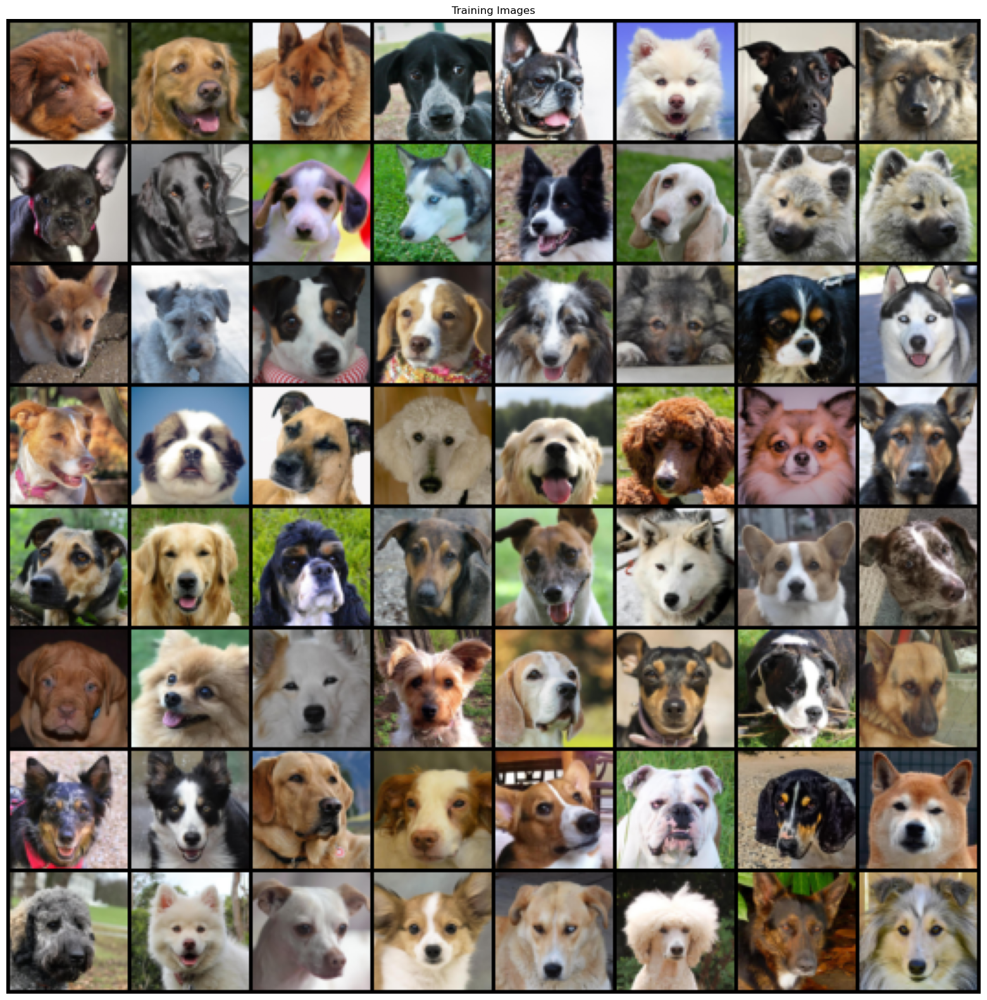

In [5]:
plt.figure(figsize=(20,20))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(image_batch.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
class Generator(nn.Module):
    
    def __init__(self,
        ngpu=NGPU,
        z=Z,
        num_gen_fm=NUM_GEN_FM,
        num_channels=NUM_CHANNELS
    ):
        super(Generator,self).__init__()
        
        self.ngu=ngpu
        self.pipe=nn.Sequential(
            
            
            #shape: 100*1*1
            nn.ConvTranspose2d(in_channels=z, out_channels=num_gen_fm*8, kernel_size=4,stride=1, padding=0,bias=False),
            nn.BatchNorm2d(num_features=num_gen_fm*8),
            nn.ReLU(inplace=True),
            
            #shape: (NUM_GEN_FM*8)*4*4
            nn.ConvTranspose2d(in_channels=num_gen_fm*8, out_channels=num_gen_fm*4, kernel_size=4,stride=2, padding=1,bias=False),
            nn.BatchNorm2d(num_features=num_gen_fm*4),
            nn.ReLU(inplace=True),
            
            
            #shape: (NUM_GEN_FM*4)*8*8
            nn.ConvTranspose2d(in_channels=num_gen_fm*4, out_channels=num_gen_fm*2, kernel_size=4,stride=2, padding=1,bias=False),
            nn.BatchNorm2d(num_features=num_gen_fm*2),
            nn.ReLU(inplace=True),
            
            #shape: (NUM_GEN_FM*2)*16*16
            nn.ConvTranspose2d(in_channels=num_gen_fm*2, out_channels=num_gen_fm, kernel_size=4,stride=2, padding=1,bias=False),
            nn.BatchNorm2d(num_features=num_gen_fm),
            nn.ReLU(inplace=True),
            
            #shape: (NUM_GEN_FM)*32*32
            nn.ConvTranspose2d(in_channels=num_gen_fm, out_channels=num_channels, kernel_size=4,stride=2, padding=1,bias=False),
            nn.Tanh()
        
            #shape: NUM_CHANNELS*64*64
        
        )
        
    def forward(self,x):
        return self.pipe(x)
    
    

In [8]:
summary(Generator())

Layer (type:depth-idx)                   Param #
Generator                                --
├─Sequential: 1-1                        --
│    └─ConvTranspose2d: 2-1              819,200
│    └─BatchNorm2d: 2-2                  1,024
│    └─ReLU: 2-3                         --
│    └─ConvTranspose2d: 2-4              2,097,152
│    └─BatchNorm2d: 2-5                  512
│    └─ReLU: 2-6                         --
│    └─ConvTranspose2d: 2-7              524,288
│    └─BatchNorm2d: 2-8                  256
│    └─ReLU: 2-9                         --
│    └─ConvTranspose2d: 2-10             131,072
│    └─BatchNorm2d: 2-11                 128
│    └─ReLU: 2-12                        --
│    └─ConvTranspose2d: 2-13             3,072
│    └─Tanh: 2-14                        --
Total params: 3,576,704
Trainable params: 3,576,704
Non-trainable params: 0

In [9]:
generator_obj = Generator(NGPU).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (NGPU > 1):
    generator_obj = nn.DataParallel(generator_obj, list(range(NGPU)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
generator_obj.apply(weights_init)

# Print the model
print(generator_obj)

DataParallel(
  (module): Generator(
    (pipe): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2

In [10]:


class Discriminator(nn.Module):
    
    def __init__(self,
        ngpu=NGPU,
        z=Z,
        num_dis_fm=NUM_DIS_FM,
        num_channels=NUM_CHANNELS
        ):


        super(Discriminator,self).__init__()
        self.ngu=ngpu
        self.pipe=nn.Sequential(
            
            
            #shape: 3*64*64
            nn.Conv2d(in_channels=num_channels,out_channels= num_dis_fm,kernel_size=4,stride=2,padding=1,bias=False),
            nn.LeakyReLU(0.2, inplace=True),
        
            #shape: num_dis_fm*32*32
            nn.Conv2d(in_channels=num_dis_fm,out_channels= num_dis_fm*2,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(num_dis_fm*2),
            nn.LeakyReLU(0.2, inplace=True),
            
            #shape: (num_dis_fm*2)*16*16
            nn.Conv2d(in_channels=num_dis_fm*2,out_channels= num_dis_fm*4,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(num_dis_fm*4),
            nn.LeakyReLU(0.2, inplace=True),
            
            
            #shape: (num_dis_fm*4)*8*8
            nn.Conv2d(in_channels=num_dis_fm*4,out_channels= num_dis_fm*8,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(num_dis_fm*8),
            nn.LeakyReLU(0.2, inplace=True),
            
            #shape: (num_dis_fm*8)*4*4
            nn.Conv2d(in_channels=num_dis_fm*8,out_channels= 1 ,kernel_size=4,stride=1,padding=0,bias=False),
            nn.Sigmoid()
            
            #shape: 1*1*1
        
        )
    def forward(self,x):
        return self.pipe(x)
    
    


In [11]:
discriminator_obj = Discriminator(NGPU).to(device)
if (device.type == 'cuda') and (NGPU > 1):
    discriminator_obj = nn.DataParallel(discriminator_obj, list(range(NGPU)))
discriminator_obj.apply(weights_init)

DataParallel(
  (module): Discriminator(
    (pipe): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    

In [12]:
loss_func = nn.BCELoss()

fixed_noise = torch.randn(16, Z, 1, 1, device=device)

real_label = 1.
fake_label = 0.

optimizerD = optim.Adam(discriminator_obj.parameters(), lr=LEARNING_RATE, betas=(BETA_1, 0.999))
optimizerG = optim.Adam(generator_obj.parameters(), lr=LEARNING_RATE, betas=(BETA_1, 0.999))

In [23]:
from tqdm import tqdm
img_list = []
G_losses = []
D_losses = []
iters = 0

for epoch in tqdm(range(MAX_EPOCHS)):
    for i, data in enumerate(train_dataloader, 0):
        discriminator_obj.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = discriminator_obj(real_cpu).view(-1)
        errD_real = loss_func(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, Z, 1, 1, device=device)
        fake = generator_obj(noise)
        label.fill_(fake_label)
        output = discriminator_obj(fake.detach()).view(-1)
        errD_fake = loss_func(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
        
        
        generator_obj.zero_grad()
        label.fill_(real_label)  
        output = discriminator_obj(fake).view(-1)
        errG = loss_func(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
    
    print("D_loss:{:.2f} G_loss:{:.2f}".format(errD.item(), errG.item()))
with torch.no_grad():
    fake = generator_obj(fixed_noise).detach().cpu()
img_list=vutils.make_grid(fake, padding=2, normalize=True,nrow=4)

  2%|█                                           | 1/40 [00:41<26:41, 41.07s/it]

D_loss:1.01 G_loss:4.62


  5%|██▏                                         | 2/40 [01:22<26:12, 41.38s/it]

D_loss:0.33 G_loss:7.39


  8%|███▎                                        | 3/40 [02:02<25:00, 40.56s/it]

D_loss:0.30 G_loss:1.60


 10%|████▍                                       | 4/40 [02:43<24:23, 40.66s/it]

D_loss:0.16 G_loss:4.14


 12%|█████▌                                      | 5/40 [03:22<23:33, 40.38s/it]

D_loss:0.63 G_loss:2.94


 15%|██████▌                                     | 6/40 [04:00<22:18, 39.38s/it]

D_loss:2.08 G_loss:1.77


 18%|███████▋                                    | 7/40 [04:38<21:28, 39.06s/it]

D_loss:0.32 G_loss:7.19


 20%|████████▊                                   | 8/40 [05:18<21:01, 39.42s/it]

D_loss:0.35 G_loss:6.11


 22%|█████████▉                                  | 9/40 [05:59<20:34, 39.82s/it]

D_loss:0.37 G_loss:1.06


 25%|██████████▊                                | 10/40 [06:36<19:24, 38.80s/it]

D_loss:0.09 G_loss:6.04


 28%|███████████▊                               | 11/40 [07:14<18:38, 38.58s/it]

D_loss:0.12 G_loss:5.88


 30%|████████████▉                              | 12/40 [07:52<17:53, 38.32s/it]

D_loss:0.08 G_loss:6.68


 32%|█████████████▉                             | 13/40 [08:29<17:10, 38.16s/it]

D_loss:0.83 G_loss:1.48


 35%|███████████████                            | 14/40 [09:04<16:05, 37.13s/it]

D_loss:0.42 G_loss:1.17


 38%|████████████████▏                          | 15/40 [09:37<14:55, 35.83s/it]

D_loss:0.18 G_loss:6.96


 40%|█████████████████▏                         | 16/40 [10:11<14:04, 35.19s/it]

D_loss:0.34 G_loss:10.91


 42%|██████████████████▎                        | 17/40 [10:44<13:16, 34.64s/it]

D_loss:0.47 G_loss:1.89


 45%|███████████████████▎                       | 18/40 [11:19<12:44, 34.75s/it]

D_loss:0.75 G_loss:0.58


 48%|████████████████████▍                      | 19/40 [11:53<12:03, 34.44s/it]

D_loss:0.47 G_loss:5.00


 50%|█████████████████████▌                     | 20/40 [12:27<11:29, 34.49s/it]

D_loss:1.74 G_loss:2.23


 52%|██████████████████████▌                    | 21/40 [13:00<10:47, 34.08s/it]

D_loss:0.93 G_loss:4.78


 55%|███████████████████████▋                   | 22/40 [13:34<10:08, 33.82s/it]

D_loss:0.18 G_loss:8.51


 57%|████████████████████████▋                  | 23/40 [14:08<09:39, 34.07s/it]

D_loss:0.55 G_loss:3.06


 60%|█████████████████████████▊                 | 24/40 [14:42<09:03, 33.99s/it]

D_loss:0.44 G_loss:6.15


 62%|██████████████████████████▉                | 25/40 [15:15<08:25, 33.67s/it]

D_loss:0.04 G_loss:5.81


 65%|███████████████████████████▉               | 26/40 [15:50<07:57, 34.11s/it]

D_loss:0.19 G_loss:6.86


 68%|█████████████████████████████              | 27/40 [16:25<07:25, 34.28s/it]

D_loss:0.20 G_loss:8.03


 70%|██████████████████████████████             | 28/40 [16:58<06:46, 33.92s/it]

D_loss:0.52 G_loss:0.83


 72%|███████████████████████████████▏           | 29/40 [17:33<06:15, 34.16s/it]

D_loss:0.05 G_loss:6.60


 75%|████████████████████████████████▎          | 30/40 [18:07<05:43, 34.31s/it]

D_loss:0.12 G_loss:5.33


 78%|█████████████████████████████████▎         | 31/40 [18:41<05:06, 34.09s/it]

D_loss:0.92 G_loss:1.29


 80%|██████████████████████████████████▍        | 32/40 [19:14<04:31, 33.91s/it]

D_loss:1.22 G_loss:8.04


 82%|███████████████████████████████████▍       | 33/40 [19:49<03:58, 34.06s/it]

D_loss:0.31 G_loss:2.97


 85%|████████████████████████████████████▌      | 34/40 [20:23<03:23, 34.00s/it]

D_loss:0.26 G_loss:4.54


 88%|█████████████████████████████████████▋     | 35/40 [20:57<02:50, 34.05s/it]

D_loss:0.08 G_loss:4.38


 90%|██████████████████████████████████████▋    | 36/40 [21:31<02:16, 34.05s/it]

D_loss:0.44 G_loss:15.45


 92%|███████████████████████████████████████▊   | 37/40 [22:04<01:41, 33.93s/it]

D_loss:0.79 G_loss:3.39


 95%|████████████████████████████████████████▊  | 38/40 [22:37<01:06, 33.49s/it]

D_loss:1.03 G_loss:3.31


 98%|█████████████████████████████████████████▉ | 39/40 [23:11<00:33, 33.60s/it]

D_loss:0.37 G_loss:5.92


100%|███████████████████████████████████████████| 40/40 [23:45<00:00, 35.63s/it]

D_loss:0.08 G_loss:5.70


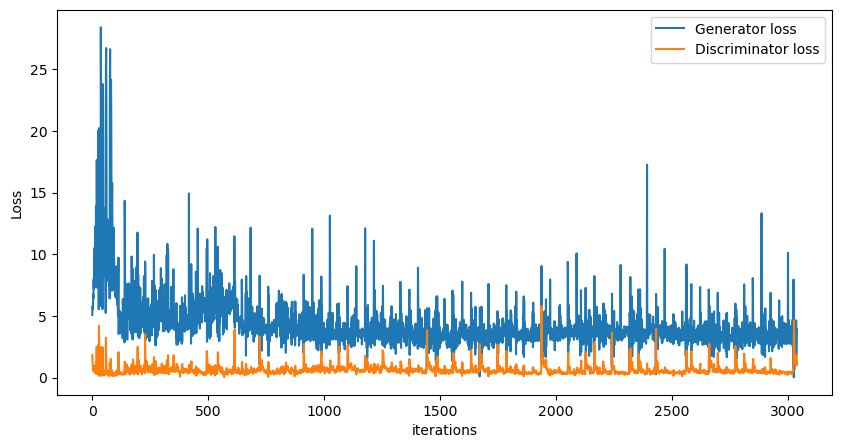

In [14]:
plt.figure(figsize=(10,5))
plt.plot(G_losses,label="Generator loss")
plt.plot(D_losses,label="Discriminator loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

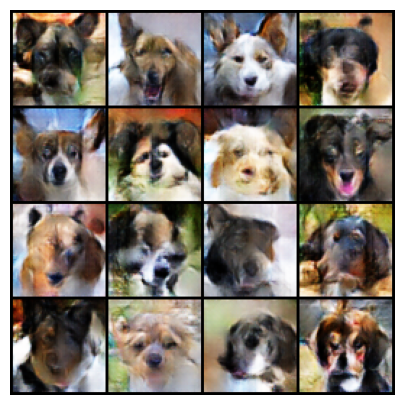

In [24]:
fig = plt.figure(figsize=(5,5))
plt.axis("off")
plt.imshow(np.transpose(img_list,(1,2,0)), animated=True)
plt.show()


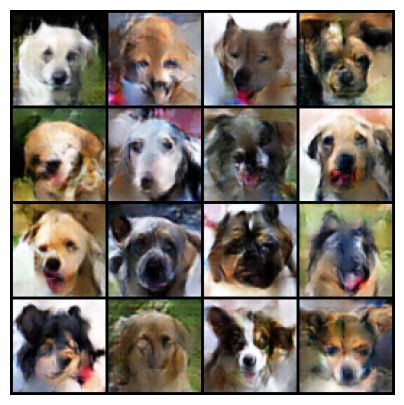

In [26]:
fixed_noise = torch.randn(16, Z, 1, 1, device=device)

fake = generator_obj(fixed_noise).detach().cpu()
img_list=vutils.make_grid(fake, padding=2, normalize=True,nrow=4)
fig = plt.figure(figsize=(5,5))
plt.axis("off")
plt.imshow(np.transpose(img_list,(1,2,0)), animated=True)
plt.show()

# INTERPOLATION AT Z SPACE

torch.Size([1, 3, 64, 64]) torch.Size([1, 3, 64, 64])


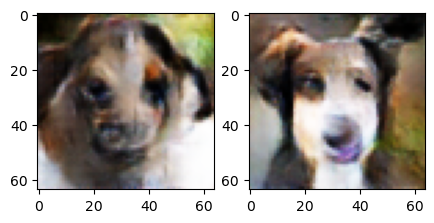

In [76]:

z1=torch.randn(1,100,1,1,device=device)
z2=torch.randn(1,100,1,1,device=device)

out1=generator_obj(z1).detach().cpu()
out2=generator_obj(z2).detach().cpu()
vutils.make_grid(out1[0].permute(1,2,0), padding=2, normalize=True)
print(out1.shape,out2.shape)
plt.figure(figsize=(5,3))
plt.subplot(1,2,1)

plt.imshow(vutils.make_grid(out1[0].permute(1,2,0), padding=2, normalize=True))
plt.subplot(1,2,2)
plt.imshow(vutils.make_grid(out2[0].permute(1,2,0), padding=2, normalize=True))
plt.show()


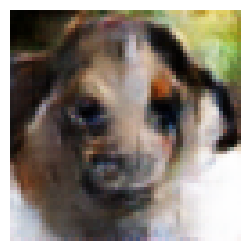

In [77]:
alpha_l=[i*0.005 for i in range(201)]
image_list=[]
for alpha in alpha_l:
    z_i=z1*alpha+z2*(1-alpha)
    image_list.append(vutils.make_grid(generator_obj(z_i).detach().cpu()[0].permute(1,2,0), padding=2, normalize=True))
    
fig = plt.figure(figsize=(3,3))
plt.axis("off")
ims = [[plt.imshow(i)] for i in image_list]
ani = animation.ArtistAnimation(fig, ims, interval=25, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())


# LOADING HYPERPARAMETRS EXPERIMENT

In [29]:
dictlr=torch.load("dictlr.pth")
dictlr.keys()

dict_keys([0.002, 0.0002, 2e-05])

torch.Size([3, 530, 530])
torch.Size([3, 530, 530])
torch.Size([3, 530, 530])


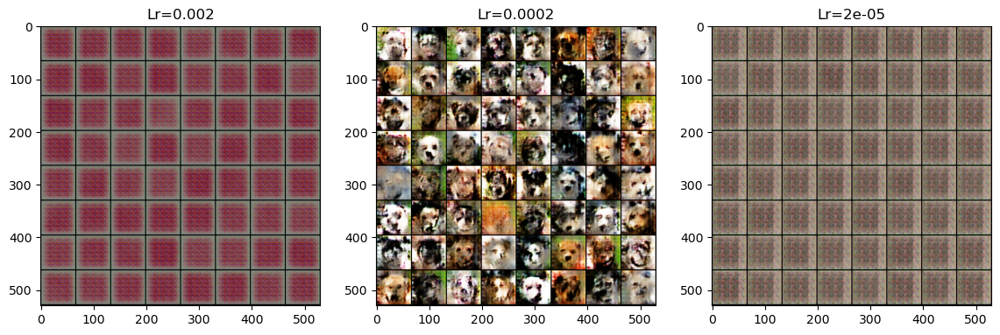

In [33]:
i=1
fig = plt.figure(figsize=(14,6))
for lr in dictlr.keys():
    print(dictlr[lr][0].shape)
    plt.subplot(1,3,i)
    plt.imshow(dictlr[lr][0].permute(1,2,0))
    plt.title(f"Lr={lr}")
    i+=1
plt.show()

In [34]:
dict_NGF=torch.load("dictlrEXP.pth")
dict_NGF.keys()

dict_keys([0.002, 0.0002, 2e-05])

torch.Size([3, 530, 530])
torch.Size([3, 530, 530])
torch.Size([3, 530, 530])


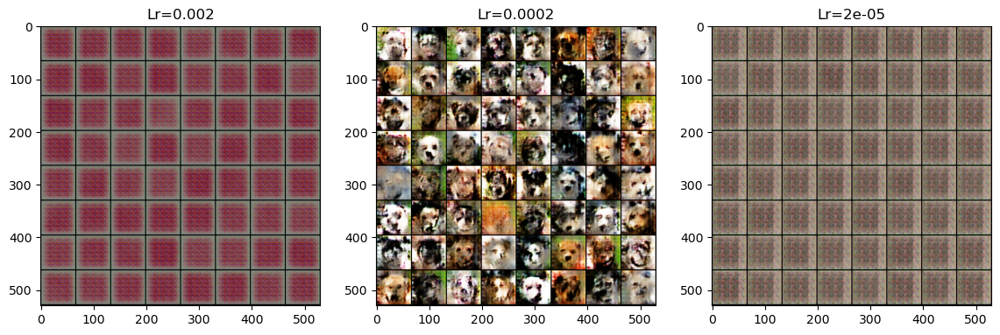

In [35]:
i=1
fig = plt.figure(figsize=(14,6))
for lr in dict_NGF.keys():
    print(dict_NGF[lr][0].shape)
    plt.subplot(1,3,i)
    plt.imshow(dict_NGF[lr][0].permute(1,2,0))
    plt.title(f"Lr={lr}")
    i+=1
plt.show()

# CHANGED THE TRAIN FUNCTION FOR HYPERPARAMETER SETTING

# DO NOT RUN THIS CODE

In [ ]:
def train(DEVICE,train_loader,EPOCHS,LEARNING_RATE,BETA1,netG,netD,OptimizerD, OptimizerG):    
    image_list = []
    generator_losses = []
    discriminator_losses = []
    iterations = 0
    Dx=[]
    loss_fun = nn.BCELoss()
    real_label = 1
    fake_label = 0
    fixed_noise = torch.randn(64, LEN_LATENT_VEC_Z, 1, 1, device=DEVICE)
    for epoch in tqdm(range(EPOCHS)):


        for i, data in enumerate(train_loader, 0):

            real_images = data[0].to(DEVICE)
            real_batch_size = real_images.size(0)
            real_labels = torch.full((real_batch_size,), real_label,dtype=torch.float, device=DEVICE)
            real_output = netD(real_images).view(-1)
            real_loss = loss_fun(real_output, real_labels)
            real_loss.backward()
            D_x = real_output.mean().item()

            netG.zero_grad()
            fake_labels = torch.full((real_batch_size,), fake_label,dtype=torch.float, device=DEVICE)
            noise = torch.randn(real_batch_size, LEN_LATENT_VEC_Z, 1, 1, device=DEVICE)
            fake_images = netG(noise)
            fake_output = netD(fake_images.detach()).view(-1)
            fake_loss = loss_fun(fake_output, fake_labels)
            fake_loss.backward()
            D_G_z1 = fake_output.mean().item()
            discriminator_loss = real_loss + fake_loss
            optimizerD.step()

            netG.zero_grad()
            generator_labels = torch.full((real_batch_size,), real_label, dtype=torch.float,device=DEVICE)
            generator_output = netD(fake_images).view(-1)
            generator_loss = loss_fun(generator_output, generator_labels)
            generator_loss.backward()
            D_G_z2 = generator_output.mean().item()
            optimizerG.step()
            
           

            generator_losses.append(generator_loss.item())
            discriminator_losses.append(discriminator_loss.item())


            
    with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
    image_grid=vutils.make_grid(fake, padding=2, normalize=True,nrows=4)
    return image_grid,generator_losses,discriminator_losses,Dx,Dgx

In [ ]:
out_channels=[32,64,128]
dict_out_channels={}
for i in range(len(out_channels)):
    print(out_channels[i])
    G_OUT_CHANNELS=out_channels[i]
    D_OUT_CHANNELS=out_channels[i]
    netD = init_D(DEVICE,N_GPU)
    netG = init_G(DEVICE,N_GPU)
    image_grid,gen_losses,disc_losses,dx,dgx=train(DEVICE,train_loader,EPOCHS,LEARNING_RATE,BETA1,netG,netD,OptimizerD, OptimizerG)
    dict_out_channels[out_channels[i]]=[image_grid,gen_losses,disc_losses,dx,dgx]
    
     

In [ ]:
i=1
fig = plt.figure(figsize=(14,6))
for oc in out_channels:
    
    print(dict_out_channels[oc][0].shape)
    plt.subplot(1,3,i)
    plt.imshow(dict_out_channels[oc][0].permute(1,2,0))
    plt.title(oc)
    i+=1
plt.show()

In [ ]:
LRS=[2*(10**-3),2*(10**-4),2*(10**-5)]
dict_lr={}
for i in range(len(LRS)):
    LEARNING_RATE =LRS[i]
    print(LEARNING_RATE)
    netD = init_D(DEVICE,N_GPU)
    netG = init_G(DEVICE,N_GPU)
    image_grid,gen_losses,disc_losses,dx,dgx=train(DEVICE,train_loader,EPOCHS,LEARNING_RATE,BETA1,netG,netD,OptimizerD, OptimizerG)
    dict_lr[LRS[i]]=[image_grid,gen_losses,disc_losses,dx,dgx]
    



In [ ]:
i=1
fig = plt.figure(figsize=(14,6))
for lr in LRS:
    
    print(dict_lr[lr][0].shape)
    plt.subplot(1,3,i)
    plt.imshow(dict_lr[lr][0].permute(1,2,0))
    plt.title(lr)
    i+=1
plt.show()